In [1]:
import folium
import csv

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as poff
import plotly.express as px
import networkx as nx

from pyvis.network import Network

In [2]:
gps_data = pd.read_csv("./data/geolife_gps_data.csv")

In [3]:
data_labels = pd.read_csv("./data/geolife_labels_data.csv")

In [4]:
nodes = pd.read_csv("./data/geolife_nodes.csv")

In [5]:
geohash_data = pd.read_csv("./data/geolife_geohash_size_8.csv")

In [6]:
groupby_geohash = pd.read_csv("./data/geolife_groupby_geohash_size_8.csv")

In [7]:
meet_geohash = pd.read_csv("./data/geolife_meet_geohash_size_8.csv")

In [8]:
meet_edges = pd.read_csv("./data/geolife_meet_edges.csv")

In [9]:
meet_edges_time = pd.read_csv("./data/meets/geolife_meet_edges_size_8_0-120s-0-100times.csv")

In [11]:
meet_edges

,A,B
0,24,7
1,24,8
2,24,19
3,24,20
4,24,25
...,...,...
16149,120,168
16150,120,169
16151,120,122
16152,120,125


In [10]:
meet_edges_time

,A,B
0,128,170
1,128,136
2,128,140
3,128,115
4,128,144
...,...,...
112,136,153
113,136,167
114,140,153
115,140,155


# 1. Dataseet map

In [10]:
gps_data

,Person ID,Trajectory,Latitude,Longitude,Altitude,Timestamp
0,0,20081023025304,39.984702,116.318417,492.000000,2008-10-23 02:53:04
1,0,20081023025304,39.984683,116.318450,492.000000,2008-10-23 02:53:10
2,0,20081023025304,39.984686,116.318417,492.000000,2008-10-23 02:53:15
3,0,20081023025304,39.984688,116.318385,492.000000,2008-10-23 02:53:20
4,0,20081023025304,39.984655,116.318263,492.000000,2008-10-23 02:53:25
...,...,...,...,...,...,...
18165796,181,20080217010131,39.988783,116.299000,114.829396,2008-02-17 10:43:09
18165797,181,20080217010131,39.989500,116.298667,98.425197,2008-02-17 10:43:56
18165798,181,20080217010131,39.990067,116.298350,131.233596,2008-02-17 10:44:26
18165799,181,20080217010131,39.989517,116.298417,150.918635,2008-02-17 10:45:23


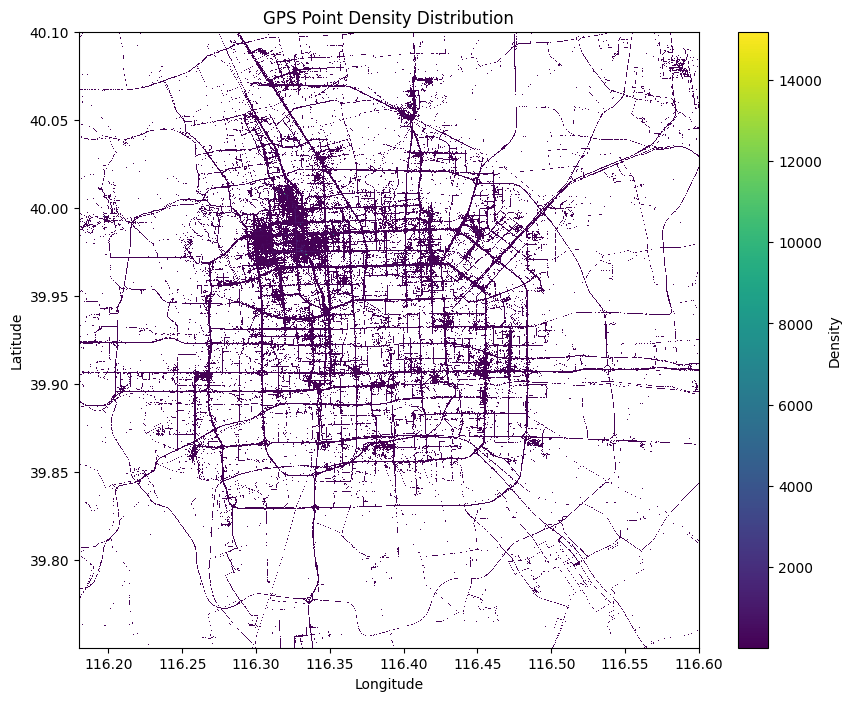

In [11]:
my_map = folium.Map(location=[39.90, 116.41], zoom_start=12)

plt.figure(figsize=(10, 8))
plt.hist2d(gps_data['Longitude'], gps_data['Latitude'], bins=2600, cmap='viridis', cmin=1)
plt.colorbar(label='Density')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('GPS Point Density Distribution')

plt.savefig('images/density_plot_geolife.png', dpi=300)
plt.show()

# 2. Distribution of transportation nodes

In [12]:
data_labels

,Start Time,End Time,Transportation Mode
0,2007/06/26 11:32:29,2007/06/26 11:40:29,bus
1,2008/03/28 14:52:54,2008/03/28 15:59:59,train
2,2008/03/28 16:00:00,2008/03/28 22:02:00,train
3,2008/03/29 01:27:50,2008/03/29 15:59:59,train
4,2008/03/29 16:00:00,2008/03/30 15:59:59,train
...,...,...,...
14713,2008/11/17 06:59:58,2008/11/17 07:06:16,bus
14714,2008/11/17 07:06:16,2008/11/17 07:14:32,walk
14715,2008/11/29 01:58:05,2008/11/29 02:01:39,bus
14716,2008/11/29 02:01:39,2008/11/29 02:07:57,walk


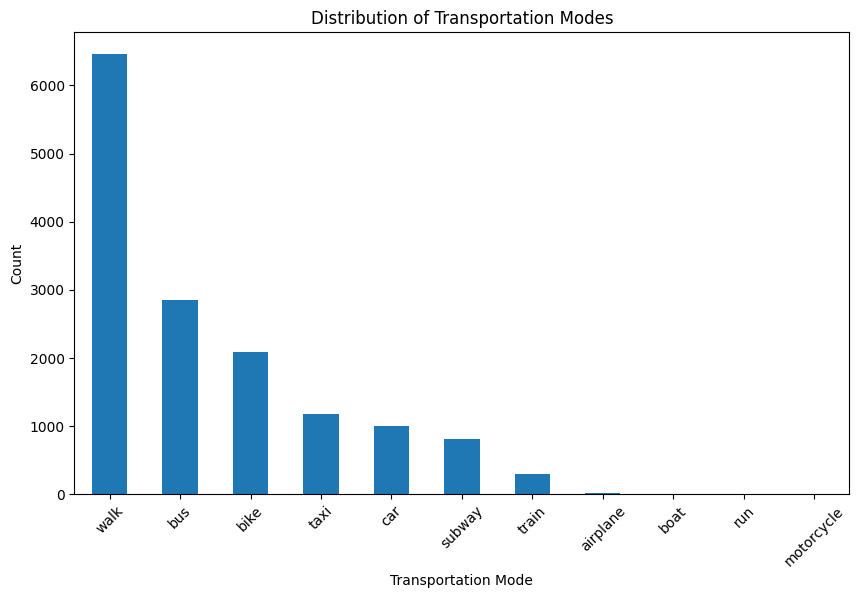

In [13]:
x = data_labels['Transportation Mode'].value_counts()

plt.figure(figsize=(10, 6))
x.plot(kind='bar')
plt.xlabel('Transportation Mode')
plt.ylabel('Count')
plt.title('Distribution of Transportation Modes')
plt.xticks(rotation=45)
plt.savefig("images/geolife_transport_distribution.png") 
plt.show()

# 3. Heatmap of Meet in Geohash

In [14]:
meet_geohash

,Geohash,persons,times,Latitude,Longitude,count_p,count_t,diff_time
0,wx4d5ydg,"[24, 39]","{""24"": [1231723532000000000], ""39"": [124200220...",39.762898,116.184426,2,2,1511853056
1,wx4d5ydh,"[24, 39]","{""24"": [1231723527000000000], ""39"": [124200219...",39.763067,116.183353,2,2,1511853056
2,wx4d5yee,"[24, 39]","{""24"": [1231723537000000000], ""39"": [124200220...",39.762820,116.185529,2,2,1511853056
3,wx4d79pz,"[23, 135]","{""23"": [1232094964000000000], ""135"": [12327861...",39.777338,116.180107,2,2,2137272320
4,wx4d79r8,"[68, 84]","{""68"": [1248833115000000000], ""84"": [122233574...",39.777448,116.180047,2,2,1764057600
...,...,...,...,...,...,...,...,...
240741,wx4uj1hn,"[67, 163]","{""67"": [1297202297000000000, 12972022980000000...",40.084734,116.592602,2,9,30650368
240742,wx4uj1hp,"[67, 163]","{""67"": [1297202293000000000, 12972022940000000...",40.084900,116.592607,2,6,1084447744
240743,wx4uj1k0,"[67, 163]","{""67"": [1297202286000000000, 12972022870000000...",40.085065,116.592540,2,10,494513152
240744,wx4uj1k1,"[67, 163]","{""67"": [1297202284000000000, 12972022850000000...",40.085178,116.592458,2,3,609611264


## 3.1 Geohash heatmap

In [15]:
import folium
import geohash
import matplotlib.pyplot as plt

df = meet_geohash.copy()

def draw_geohash_rectangles_colored(df):
	cmap = plt.cm.get_cmap('viridis')
	norm = plt.Normalize(vmin=df['count_p'].min(), vmax=df['count_p'].max())
	
	m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=10)

	for index, row in df.iterrows():
		geohash_code = row['Geohash']
		
		bounding_box = geohash.bbox(geohash_code)
		
		min_lat = float(bounding_box['s'])
		min_lon = float(bounding_box['w'])
		max_lat = float(bounding_box['n'])
		max_lon = float(bounding_box['e'])

		center_lat = (min_lat + max_lat) / 2
		center_lon = (min_lon + max_lon) / 2

		color = cmap(norm(row['count_p']))
		color_hex = '#%02x%02x%02x' % tuple(int(255 * rgb) for rgb in color[:3])

		folium.Rectangle(bounds=[[min_lat, min_lon], [max_lat, max_lon]],
						color=color_hex,
						fill=True,
						fill_opacity=0.5,
						tooltip=f'Lat: {center_lat}, Long: {center_lon}').add_to(m)

	return m

m = draw_geohash_rectangles_colored(df)
m.save('./htmls/geolife_colored_geohash.html')

C:\Users\danstorm\AppData\Local\Temp\ipykernel_8892\3177319344.py:8: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



In [16]:
fig = px.density_mapbox(
	meet_geohash, 
	lat='Latitude', 
	lon='Longitude',
	z='count_p',
	radius=10,
	center=dict(lat=meet_geohash['Latitude'].mean(), lon=meet_geohash['Longitude'].mean()),
	zoom=10,
)
fig.update_layout(mapbox_style="open-street-map")
poff.plot(fig, filename='htmls/geolife_meet_in_geohash_heatmap.html')
fig.show()

# 4. Distribution of meets in Geohash

## 4.1 by number of people

C:\Users\danstorm\AppData\Local\Temp\ipykernel_8892\733333457.py:9: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



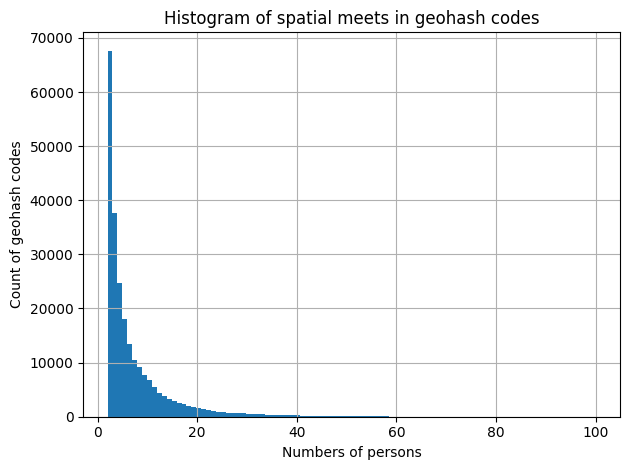

In [18]:
# meet_geohash['count_p'].hist(bins=100, log=True)
f = meet_geohash[(meet_geohash['count_p']<=100) & (meet_geohash['count_p']>=2) ]['count_p'].hist(bins=99, log=False).get_figure()
# v kolkych geohash kodoch sa stretlo dany pocet ludi. X - Pocet ludi, Y - pocet geohash
plt.xlabel('Numbers of persons')
plt.ylabel('Count of geohash codes')
plt.title('Histogram of spatial meets in geohash codes')
# plt.xticks(rotation=60)
plt.tight_layout()
plt.savefig("images/hist_spatial_meets_geolife.png") 
f.show()

C:\Users\danstorm\AppData\Local\Temp\ipykernel_8892\3507104918.py:9: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



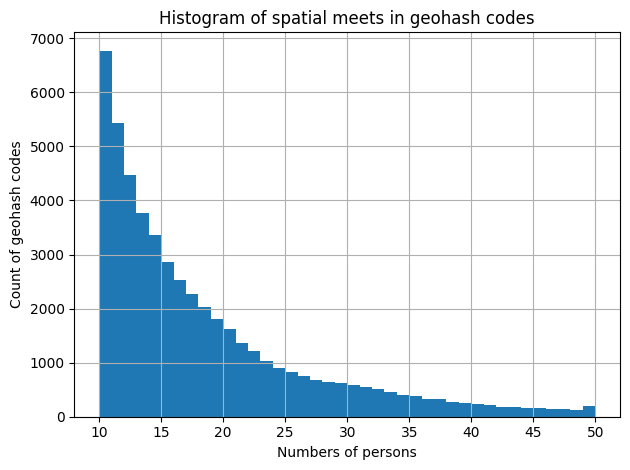

In [20]:
f = meet_geohash[(meet_geohash['count_p']<=50) & (meet_geohash['count_p']>=10) ]['count_p'].hist(bins=40, log=False).get_figure()
# v kolkych geohash kodoch sa stretlo dany pocet ludi. X - Pocet ludi, Y - pocet geohash
plt.xlabel('Numbers of persons')
plt.ylabel('Count of geohash codes')
plt.title('Histogram of spatial meets in geohash codes')
# plt.xticks(rotation=60)
plt.tight_layout()
plt.savefig("images/hist_spatial_meets_geolife_10_to_50.png") 
f.show()

C:\Users\danstorm\AppData\Local\Temp\ipykernel_8892\1937215424.py:9: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



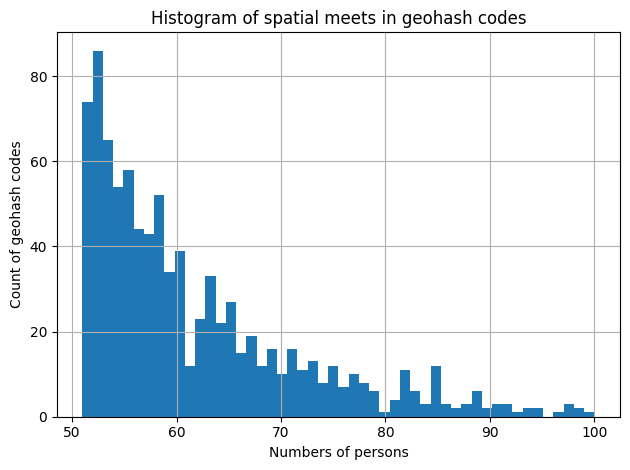

In [21]:
f = meet_geohash[(meet_geohash['count_p']<=100) & (meet_geohash['count_p']>50) ]['count_p'].hist(bins=50, log=False).get_figure()
# v kolkych geohash kodoch sa stretlo dany pocet ludi. X - Pocet ludi, Y - pocet geohash
plt.xlabel('Numbers of persons')
plt.ylabel('Count of geohash codes')
plt.title('Histogram of spatial meets in geohash codes')
# plt.xticks(rotation=60)
plt.tight_layout()
plt.savefig("images/hist_spatial_meets_geolife_50_to_100.png") 
f.show()

## 4.2 by time diff between meet

In [24]:
meet_geohash[(meet_geohash['diff_time']<200000) & (meet_geohash['diff_time']>0)]

,Geohash,persons,times,Latitude,Longitude,count_p,count_t,diff_time
558,wx4dgv9b,"[2, 17, 41, 144]","{""2"": [1225522206000000000], ""17"": [1225856822...",39.888731,116.183069,4,22,124416
2231,wx4dnqzp,"[0, 3, 4, 15, 30]","{""0"": [1239353678000000000, 123936877300000000...",39.764933,116.300149,5,91,33280
2974,wx4dptew,"[41, 130]","{""41"": [1244268614000000000, 12442686150000000...",39.757911,116.350187,2,25,11776
6784,wx4dtfnh,"[26, 43]","{""26"": [1239767293000000000, 12397672980000000...",39.826217,116.276746,2,3,6144
26389,wx4dzyb8,"[4, 14, 19, 30, 37, 39, 41, 79, 84, 126, 142, ...","{""4"": [1230685737000000000, 123068574200000000...",39.895572,116.357123,13,23,166400
37606,wx4emwzr,"[128, 163]","{""128"": [1240374768000000000, 1240374770000000...",39.984694,116.267611,2,4,21504
37719,wx4emy7v,"[128, 140]","{""128"": [1209292438000000000, 1209292439000000...",39.981560,116.273602,2,98,172032
38710,wx4en6bh,"[3, 37, 42, 66, 85, 128]","{""3"": [1233792306000000000], ""37"": [1237172237...",39.918231,116.290401,6,8,44032
47051,wx4ep8tp,"[2, 36]","{""2"": [1226400471000000000, 122692071600000000...",39.906394,116.352294,2,11,175104
52129,wx4epr2u,"[22, 29]","{""22"": [1234075362000000000, 12340753630000000...",39.942945,116.335414,2,144,31744


<Axes: >

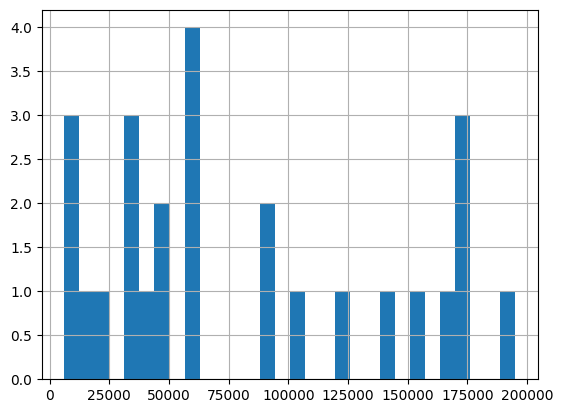

In [25]:
meet_geohash[(meet_geohash['diff_time']<=200000) 
             & (meet_geohash['diff_time']>0)]['diff_time'].hist(bins=30) 
# pocet geohash podla min,max casu,  X - sekundy medzi min/max  , Y - pocet geohash

<Axes: >

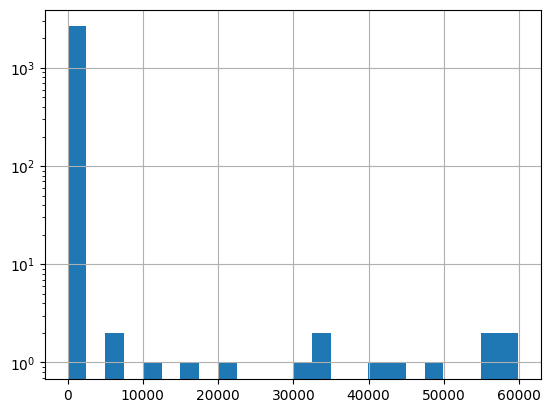

In [24]:
meet_geohash[(meet_geohash['diff_time']<=60*60*24) & (meet_geohash['diff_time']>=0)]['diff_time'].hist(bins=24,log=True) 
# pocet geohash podla min,max casu,  X - sekundy medzi min/max  , Y - pocet geohash

<Axes: >

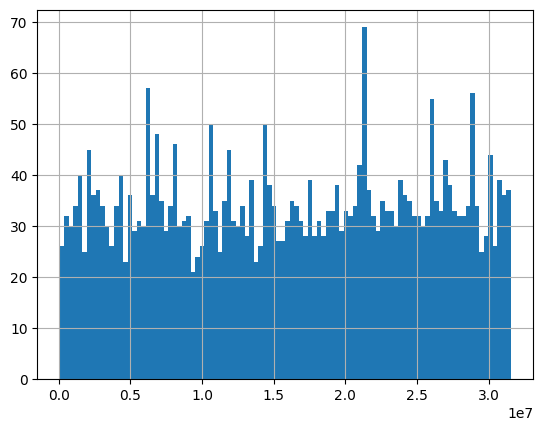

In [25]:
meet_geohash[(meet_geohash['diff_time']<=365*24*60*60) & (meet_geohash['diff_time']>=24*60*60)]['diff_time'].hist(bins=100) 
# pocet geohash podla min,max casu,  X - dni medzi min/max  , Y - pocet geohash

<Axes: >

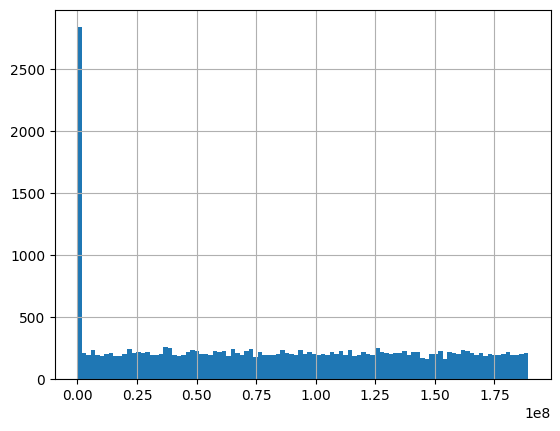

In [26]:
meet_geohash[meet_geohash['diff_time']<=60*60*24*365*6]['diff_time'].hist(bins=100, log=False)
# pocet geohash podla min,max casu,  X - dni medzi min/max  , Y - pocet geohash

# 5. Meeting graphs

In [27]:
def visualize_graph(edges, nodes, name):
	G = nx.Graph()
	G.add_nodes_from(nodes)
	G.add_edges_from(edges)

	nt = Network(directed=False, notebook=True)

	for node in G.nodes:
		nt.add_node(node, title=str(node), label=str(node))

	nt.from_nx(G)

	nt.show('htmls/'+name+'.html')

## 5.1. By geohash without time

In [28]:
meet_edges

,A,B
0,24,7
1,24,8
2,24,19
3,24,20
4,24,25
...,...,...
16149,120,168
16150,120,169
16151,120,122
16152,120,125


In [29]:
def load_graph_edges(file_path):
	with open(file_path, 'r') as csvfile:
		reader = csv.reader(csvfile)
		next(reader)
		edges = [tuple(map(int, row)) for row in reader]

	return edges

def load_nodes(file_path):
	with open(file_path, 'r') as csvfile:
		reader = csv.reader(csvfile)
		next(reader)
		nodes = [int(row[0]) for row in reader]

	return nodes

In [30]:
graph_edges = load_graph_edges("data/geolife_meet_edges.csv")
nodes = load_nodes("data/geolife_nodes.csv")
visualize_graph(graph_edges, nodes, "geolife_meet")

htmls/geolife_meet.html


## 5.2. By geohash and time

In [31]:
graph_edges = load_graph_edges("data/meets/geolife_meet_edges_size_8_0-120s-0-100times.csv")
nodes = load_nodes("data/geolife_nodes.csv")
visualize_graph(graph_edges, nodes, "geolife_meet_time")

htmls/geolife_meet_time.html
